In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
from predict import mydynamo

In [3]:
for i in range(2001,2020) : 
    print(i)
obs = pd.read_csv('countries.csv')
obs

2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019


,id,created_at,updated_at,code,name,iso_code,iso_name,parentCode,parentName
0,1,2021-01-06 05:28:44,2021-01-06 05:28:44,4,Afghanistan,AF,Afghanistan,13,South Asia
1,2,2021-01-06 05:28:45,2021-01-06 05:28:45,8,Albania,AL,Albania,6,East Europe & Central Asia
2,3,2021-01-06 05:28:45,2021-01-06 05:28:45,12,Algeria,DZ,Algeria,11,Northern Africa
3,4,2021-01-06 05:28:45,2021-01-06 05:28:45,16,American Samoa,AS,American Samoa,12,Pacific
4,5,2021-01-06 05:28:45,2021-01-06 05:28:45,20,Andorra,AD,Andorra,4,EU & West Europe
...,...,...,...,...,...,...,...,...,...
217,218,2021-01-06 05:29:04,2021-01-06 05:29:04,876,Wallis and Futuna Islands,WF,Wallis and Futuna,12,Pacific
218,219,2021-01-06 05:29:04,2021-01-06 05:29:04,732,Western Sahara,EH,Western Sahara,11,Northern Africa
219,220,2021-01-06 05:29:05,2021-01-06 05:29:05,887,Yemen,YE,Yemen,9,Middle East
220,221,2021-01-06 05:29:05,2021-01-06 05:29:05,894,Zambia,ZM,Zambia,14,Southern Africa


In [4]:
X = pd.read_csv('data/export-hs4-pivot.csv')
X_dict = {}
obs_dict = {}

for i in range(2001,2020,4) :
    # X_new = X
    X_new = X.loc[X['year_at'] == i]
    X_new = X_new.drop(['year_at'], axis=1)
    X_new = X_new.set_index(['exporter'])    
    
    obs = pd.read_csv('countries.csv')
    obs['year_at'] = i
    obs_new = obs.set_index(['name'])    
    
    [X_new, obs_new] = mydynamo.removeOutlierObservationExtra(X_new, obs_new)
    X_dict[str(i)] = X_new
    obs_dict[str(i)] = obs_new
#     break
    
X_new = mydynamo.concatDataFrameExtra(X_dict)
obs = mydynamo.concatDataFrameExtra(obs_dict)


In [5]:
X_new

0101  0102  0103  0104    0105    0106  0201  \
     exporter                                                                   
2001 Afghanistan                  0.0   0.0   0.0   0.0     0.0     0.0   0.0   
     Albania                      0.0  18.0   0.0   9.0     9.0   120.0   0.0   
     Algeria                      0.0   0.0   0.0   0.0     0.0     0.0   0.0   
     American Samoa               0.0   0.0   0.0   0.0     0.0     0.0   0.0   
     Andorra                    127.0   0.0   0.0  10.0     0.0     0.0  94.0   
...                               ...   ...   ...   ...     ...     ...   ...   
2017 Wallis and Futuna Islands    0.0   0.0   0.0   0.0     0.0     0.0   0.0   
     Western Sahara               0.0   0.0   0.0   0.0     0.0     0.0   0.0   
     Yemen                        5.0   0.0   0.0   5.0     0.0     0.0   0.0   
     Zambia                       9.0   0.0   0.0   0.0  3877.0   137.0   2.0   
     Zimbabwe                    94.0   7.0   0.0   0.0   653.0  1477.0   0.0   

                                0202  0203  0204  ...  9618    9619  9620  \
     exporter                                     ...                       
2001 Afghanistan                 0.0   0.0   0.0  ...   0.0     0.0   0.0   
     Albania                     0.0   6.0  10.0  ...   0.0     0.0   0.0   
     Algeria                     0.0   0.0   0.0  ...   0.0     0.0   0.0   
     American Samoa              0.0   0.0   0.0  ...   0.0     0.0   0.0   
     Andorra                    42.0   1.0   0.0  ...   1.0     0.0   0.0   
...                              ...   ...   ...  ...   ...     ...   ...   
2017 Wallis and Futuna Islands   0.0   0.0   0.0  ...   0.0     0.0   0.0   
     Western Sahara              0.0   0.0   0.0  ...   0.0     0.0   0.0   
     Yemen                       0.0   0.0   1.0  ...   0.0     0.0   0.0   
     Zambia                      2.0   2.0   0.0  ...   0.0  1256.0   0.0   
     Zimbabwe                    0.0   5.0   0.0  ...   0.0    43.0   0.0   

                                9701  9702    9703  9704    9705   9706  \
     exporter                                                             
2001 Afghanistan                 0.0   0.0     0.0   0.0     0.0    0.0   
     Albania                    10.0   1.0     0.0   0.0     0.0  110.0   
     Algeria                     1.0   0.0     0.0   0.0     0.0    0.0   
     American Samoa              0.0   0.0     0.0   0.0     0.0    0.0   
     Andorra                    32.0   0.0     2.0   0.0     0.0    0.0   
...                              ...   ...     ...   ...     ...    ...   
2017 Wallis and Futuna Islands   0.0   0.0     0.0   0.0   100.0    0.0   
     Western Sahara              0.0   0.0     0.0   0.0     8.0    0.0   
     Yemen                       0.0   0.0     0.0   0.0    15.0  512.0   
     Zambia                     54.0   0.0     2.0   0.0   615.0    1.0   
     Zimbabwe                   22.0   1.0  2261.0   0.0  8867.0    0.0   

                                   9999  
     exporter                            
2001 Afghanistan                    0.0  
     Albania                        0.0  
     Algeria                        0.0  
     American Samoa                 0.0  
     Andorra                     1332.0  
...                                 ...  
2017 Wallis and Futuna Islands     47.0  
     Western Sahara                 3.0  
     Yemen                      19124.0  
     Zambia                      4006.0  
     Zimbabwe                     398.0  

[1095 rows x 1258 columns]

In [6]:
obs

id           created_at           updated_at  \
     name                                                                       
2001 Afghanistan                  1  2021-01-06 05:28:44  2021-01-06 05:28:44   
     Albania                      2  2021-01-06 05:28:45  2021-01-06 05:28:45   
     Algeria                      3  2021-01-06 05:28:45  2021-01-06 05:28:45   
     American Samoa               4  2021-01-06 05:28:45  2021-01-06 05:28:45   
     Andorra                      5  2021-01-06 05:28:45  2021-01-06 05:28:45   
...                             ...                  ...                  ...   
2017 Wallis and Futuna Islands  218  2021-01-06 05:29:04  2021-01-06 05:29:04   
     Western Sahara             219  2021-01-06 05:29:04  2021-01-06 05:29:04   
     Yemen                      220  2021-01-06 05:29:05  2021-01-06 05:29:05   
     Zambia                     221  2021-01-06 05:29:05  2021-01-06 05:29:05   
     Zimbabwe                   222  2021-01-06 05:29:05  2021-01-06 05:29:05   

                                code iso_code           iso_name  parentCode  \
     name                                                                      
2001 Afghanistan                   4       AF        Afghanistan          13   
     Albania                       8       AL            Albania           6   
     Algeria                      12       DZ            Algeria          11   
     American Samoa               16       AS     American Samoa          12   
     Andorra                      20       AD            Andorra           4   
...                              ...      ...                ...         ...   
2017 Wallis and Futuna Islands   876       WF  Wallis and Futuna          12   
     Western Sahara              732       EH     Western Sahara          11   
     Yemen                       887       YE              Yemen           9   
     Zambia                      894       ZM             Zambia          14   
     Zimbabwe                    716       ZW           Zimbabwe          14   

                                                parentName  year_at  
     name                                                            
2001 Afghanistan                                South Asia     2001  
     Albania                    East Europe & Central Asia     2001  
     Algeria                               Northern Africa     2001  
     American Samoa                                Pacific     2001  
     Andorra                              EU & West Europe     2001  
...                                                    ...      ...  
2017 Wallis and Futuna Islands                     Pacific     2017  
     Western Sahara                        Northern Africa     2017  
     Yemen                                     Middle East     2017  
     Zambia                                Southern Africa     2017  
     Zimbabwe                              Southern Africa     2017  

[1095 rows x 9 columns]

In [7]:
var = pd.DataFrame(np.array(X.columns)[2:], columns=['hscode'])
var = var.set_index('hscode')
var

""
hscode
0101
0102
0103
0104
0105
...
9703
9704
9705


In [8]:
mydynamo.config()

package,anndata,colorcet,cvxopt,dynamo-release,hdbscan,loompy,matplotlib,numba,numdifftools,numpy,pandas,pynndescent,python-igraph,scikit-learn,scipy,seaborn,setuptools,statsmodels,tqdm,trimap,umap-learn
version,0.7.5,2.0.2,1.2.5.post1,0.95.2,0.8.26,3.0.6,3.3.3,0.52.0,0.9.39,1.19.3,1.2.0,0.5.1,0.8.3,0.24.0,1.6.0,0.11.1,49.2.1,0.12.1,4.56.0,1.4.3.dev1,0.4.6


In [9]:
adata = mydynamo.createAnnotationData(X_new, X_new, obs, var, False)
adata

AnnData object with n_obs × n_vars = 1095 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName', 'year_at'
    layers: 'spliced', 'unspliced'

In [10]:
mydynamo.dynamoProcess(adata)

AnnData expects .obs.index to contain strings, but your first indices are: Index([('2001', 'Afghanistan'), ('2001', 'Albania')], dtype='object'), …
AnnData expects .obs.index to contain strings, but your first indices are: Index([('2001', 'Afghanistan'), ('2001', 'Albania')], dtype='object'), …
calculating transition matrix via pearson kernel with sqrt transform.: 100%|█| 
projecting velocity vector to low dimensional embedding...: 100%|█| 1095/1095 [


AnnData object with n_obs × n_vars = 1095 × 1258
    obs: 'id', 'created_at', 'updated_at', 'code', 'iso_code', 'iso_name', 'parentCode', 'parentName', 'year_at', 'nGenes', 'nCounts', 'pMito', 'use_for_pca', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'Size_Factor', 'initial_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr'
    var: 'pass_basic_filter', 'use_for_pca', 'ntr', 'beta', 'gamma', 'half_life', 'alpha_b', 'alpha_r2', 'gamma_b', 'gamma_r2', 'gamma_logLL', 'delta_b', 'delta_r2', 'uu0', 'ul0', 'su0', 'sl0', 'U0', 'S0', 'total0', 'use_for_dynamics', 'use_for_transition'
    uns: 'pp_norm_method', 'PCs', 'explained_variance_ratio_', 'pca_fit', 'feature_selection', 'dynamics', 'neighbors', 'umap_fit', 'grid_velocity_umap'
    obsm: 'X_pca', 'X', 'X_umap', 'velocity_umap'
    layers: 'spliced', 'unspliced', 'X_unspliced', 'X_spliced', 'M_u', 'M_uu', 'M_s', 'M_us', 'M_ss', 'velocity_S'
    obsp: 'moments_con', 'connectivities', 'distances', 'pearson_tr

In [11]:
adata.obsm['velocity_umap'] = adata.obsm['velocity_umap']*0
adata.obsm['velocity_umap']

array([[ 0., -0.],
       [-0.,  0.],
       [-0., -0.],
       ...,
       [-0.,  0.],
       [ 0.,  0.],
       [-0.,  0.]])

In [12]:
adata.obs

,id,created_at,updated_at,code,iso_code,iso_name,parentCode,parentName,year_at,nGenes,nCounts,pMito,use_for_pca,unspliced_Size_Factor,initial_unspliced_cell_size,Size_Factor,initial_cell_size,spliced_Size_Factor,initial_spliced_cell_size,ntr
"(2001, Afghanistan)",1,2021-01-06 05:28:44,2021-01-06 05:28:44,4,AF,Afghanistan,13,South Asia,2001,0,0.0,NaN,False,4.662105e-07,1.0,4.662105e-07,1.0,4.662105e-07,1.0,NaN
"(2001, Albania)",2,2021-01-06 05:28:45,2021-01-06 05:28:45,8,AL,Albania,6,East Europe & Central Asia,2001,462,304926.0,0.0,True,1.421597e-01,304926.0,1.421597e-01,304926.0,1.421597e-01,304926.0,0.5
"(2001, Algeria)",3,2021-01-06 05:28:45,2021-01-06 05:28:45,12,DZ,Algeria,11,Northern Africa,2001,314,19147592.0,0.0,True,8.926811e+00,19147599.0,8.926810e+00,19147598.0,8.926811e+00,19147599.0,0.5
"(2001, American Samoa)",4,2021-01-06 05:28:45,2021-01-06 05:28:45,16,AS,American Samoa,12,Pacific,2001,0,0.0,NaN,False,4.662105e-07,1.0,4.662105e-07,1.0,4.662105e-07,1.0,NaN
"(2001, Andorra)",5,2021-01-06 05:28:45,2021-01-06 05:28:45,20,AD,Andorra,4,EU & West Europe,2001,388,52413.0,0.0,True,2.443549e-02,52413.0,2.443549e-02,52413.0,2.443549e-02,52413.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"(2017, Wallis and Futuna Islands)",218,2021-01-06 05:29:04,2021-01-06 05:29:04,876,WF,Wallis and Futuna,12,Pacific,2017,51,1029.0,0.0,True,4.797306e-04,1029.0,4.797306e-04,1029.0,4.797306e-04,1029.0,0.5
"(2017, Western Sahara)",219,2021-01-06 05:29:04,2021-01-06 05:29:04,732,EH,Western Sahara,11,Northern Africa,2017,57,891.0,0.0,True,4.153935e-04,891.0,4.153935e-04,891.0,4.153935e-04,891.0,0.5
"(2017, Yemen)",220,2021-01-06 05:29:05,2021-01-06 05:29:05,887,YE,Yemen,9,Middle East,2017,299,2342822.0,0.0,True,1.092248e+00,2342822.0,1.092248e+00,2342822.0,1.092248e+00,2342822.0,0.5
"(2017, Zambia)",221,2021-01-06 05:29:05,2021-01-06 05:29:05,894,ZM,Zambia,14,Southern Africa,2017,669,8156618.0,0.0,True,3.802701e+00,8156618.0,3.802701e+00,8156618.0,3.802701e+00,8156618.0,0.5


<Figure size 1200x800 with 0 Axes>

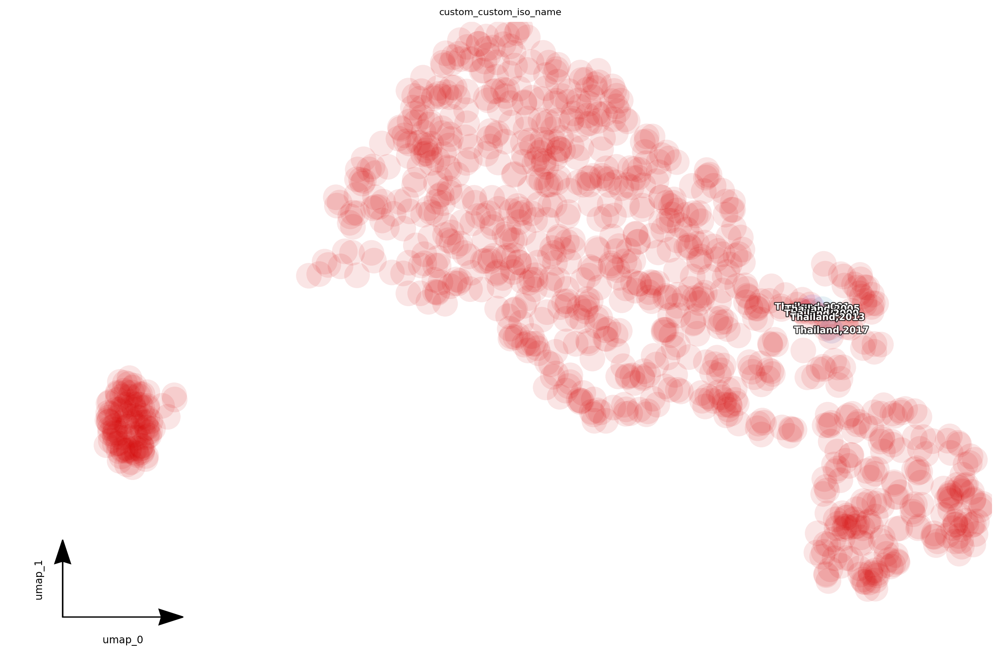

In [13]:
adata.obs['custom_iso_name'] = adata.obs.apply(lambda x: x['iso_name']+","+str(x['year_at']), axis=1)
mydynamo.dynamoLargePlot(adata,'custom_iso_name', 'iso_name',["Thailand"])

<Figure size 1200x800 with 0 Axes>

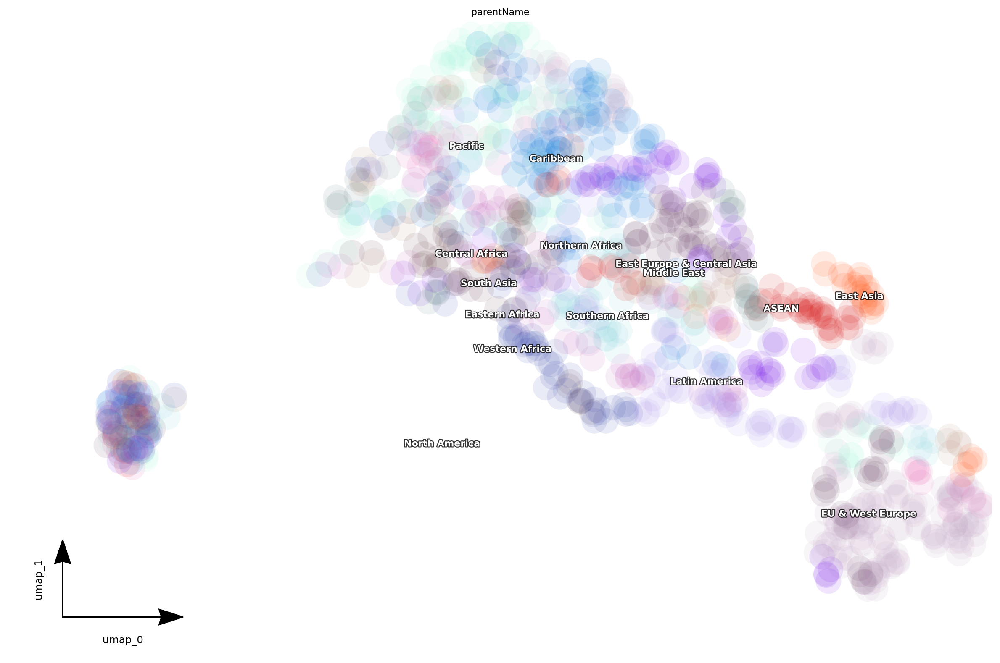

In [14]:
# adata.obs['custom_iso_name'] = adata.obs.apply(lambda x: x['iso_name']+","+str(x['year_at']), axis=1)
mydynamo.dynamoLargePlot(adata,'parentName')

<Figure size 1200x800 with 0 Axes>

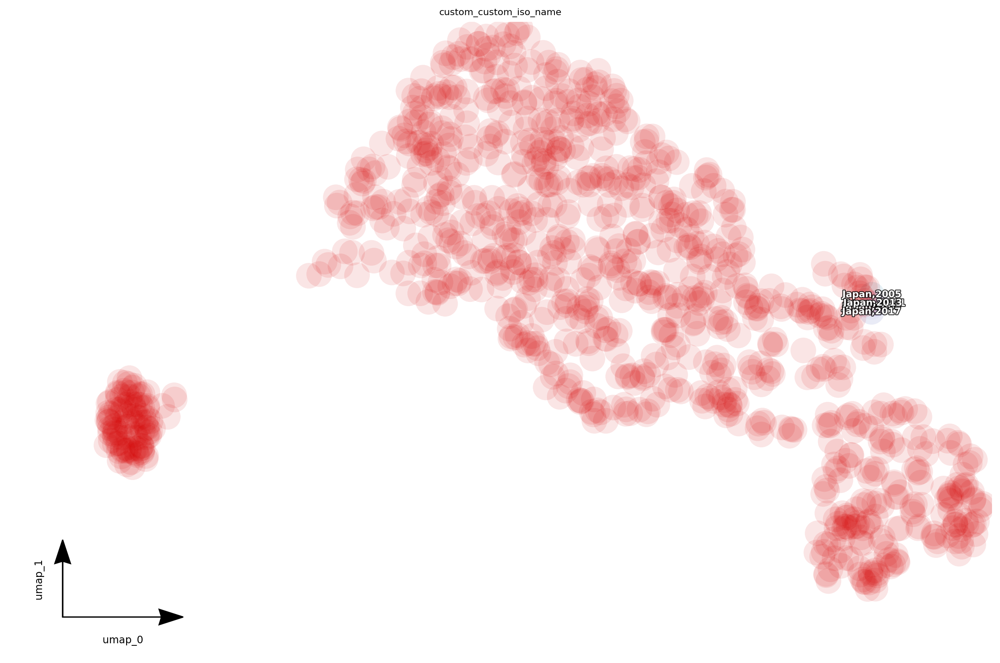

In [19]:
adata.obs['custom_iso_name'] = adata.obs.apply(lambda x: x['iso_name']+","+str(x['year_at']), axis=1)
mydynamo.dynamoLargePlot(adata,'custom_iso_name','iso_name',["Japan"])

<Figure size 2400x1600 with 0 Axes>

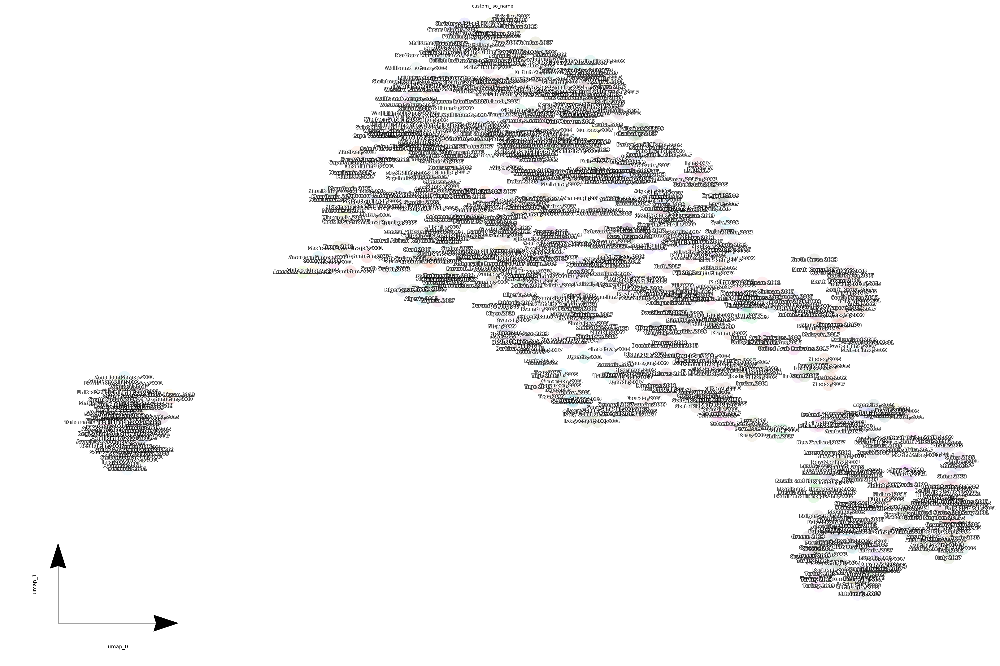

In [16]:
adata.obs['custom_iso_name'] = adata.obs.apply(lambda x: x['iso_name']+","+str(x['year_at']), axis=1)
mydynamo.dynamoVeryLargePlot(adata,'custom_iso_name')